In [2]:
%cd ..
%ls

/home/nas3_userJ/dmkim/OnlineTSAD
cfgs/         EDA/      hptune/  outputs/  test.py*   Vis/
checkpoints/  Exp/      logs/    plots/    train.py*  wandb/
data/         figures/  models/  results/  utils/


In [3]:
import torch
from torch import optim
import torch.nn.functional as F

import matplotlib.pyplot as plt

from utils.metrics import get_summary_stats

from models.MLP import MLP

import wandb
import hydra
from omegaconf import DictConfig

from utils.logger import make_logger
from utils.argpass import prepare_arguments, configure_exp_id
from utils.tools import SEED_everything, plot_interval

import warnings
from data.load_data import DataFactory
from Exp.ReconBaselines import *

from easydict import EasyDict as edict
import yaml
import re
import copy

warnings.filterwarnings("ignore")

In [4]:
# load yaml
cfg = {}
loader = yaml.SafeLoader
loader.add_implicit_resolver(
    u'tag:yaml.org,2002:float',
    re.compile(u'''^(?:
     [-+]?(?:[0-9][0-9_]*)\\.[0-9_]*(?:[eE][-+]?[0-9]+)?
    |[-+]?(?:[0-9][0-9_]*)(?:[eE][-+]?[0-9]+)
    |\\.[0-9_]+(?:[eE][-+][0-9]+)?
    |[-+]?[0-9][0-9_]*(?::[0-5]?[0-9])+\\.[0-9_]*
    |[-+]?\\.(?:inf|Inf|INF)
    |\\.(?:nan|NaN|NAN))$''', re.X),
    list(u'-+0123456789.'))

# get cfg
model = "MLP"
with open("cfgs/test_defaults.yaml", "r") as file:
    basic_config = yaml.load(file, Loader=loader)
    cfg.update(basic_config)
with open(f"cfgs/model/{model}.yaml", "r") as file:
    model_config = yaml.load(file, Loader=loader)
    cfg.update({"model": model_config})
cfg['dataset'] = 'SWaT'
cfg["normalization"] = 'ARevIN'
cfg["gamma"] = 0.5

In [5]:
args = prepare_arguments(cfg)
args.model.latent_dim = 128
args.window_size = 12
args.eval_batch_size = 1
args.dataset = "SWaT"
print(args)

logger = make_logger(os.path.join(args.log_path, f'{args.exp_id}.log'))
logger.info(f"Configurations: {args}")

# Data
logger.info(f"Preparing {args.dataset} dataset...")
datafactory = DataFactory(args, logger)
train_dataset, train_loader, test_dataset, test_loader = datafactory()
args.num_channels = train_dataset.X.shape[1]
train_X, train_y, test_X, test_y = train_dataset.X, train_dataset.y, test_dataset.X, test_dataset.y


print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

[2023-04-15 03:45:08,986] Configurations: {'exp_id': 'MLP_SWaT_normalization_ARevIN', 'infer_options': ['offline', 'online_ST'], 'dataset': 'SWaT', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 1, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'TT_loss': 'bce', 'cls_lambda': 1, 'ttlr': 0.001, 'thlr': 0.001, 'normalization': 'ARevIN', 'gamma': 0.5, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_SWaT_normalization_ARevIN', 'log_path': './logs/MLP_SWaT_normalization_ARevIN', 'output_path': './outputs/MLP_SWaT_normalization_ARevIN', 'plot_path': './plots/MLP_SWaT_normalization_ARevIN', 'result_path': './results/MLP_SWaT_normalization_ARevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'home_dir': '.', 'device': device(type='cuda')}
[2023-04-15 03:45:08,987] Preparing SWaT dataset...
[2023-04-15 03:45:08,987] current location: 

{'exp_id': 'MLP_SWaT_normalization_ARevIN', 'infer_options': ['offline', 'online_ST'], 'dataset': 'SWaT', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 1, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'TT_loss': 'bce', 'cls_lambda': 1, 'ttlr': 0.001, 'thlr': 0.001, 'normalization': 'ARevIN', 'gamma': 0.5, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_SWaT_normalization_ARevIN', 'log_path': './logs/MLP_SWaT_normalization_ARevIN', 'output_path': './outputs/MLP_SWaT_normalization_ARevIN', 'plot_path': './plots/MLP_SWaT_normalization_ARevIN', 'result_path': './results/MLP_SWaT_normalization_ARevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'home_dir': '.', 'device': device(type='cuda')}


[2023-04-15 03:45:16,132] train: X - (496800, 51), y - (496800,) test: X - (449919, 51), y - (449919,)
[2023-04-15 03:45:16,203] Complete.
[2023-04-15 03:45:16,204] Preparing dataloader...
[2023-04-15 03:45:16,681] total train dataset- 7763, batch_X - torch.Size([64, 12, 51]), batch_y - torch.Size([64, 12])
[2023-04-15 03:45:16,683] total test dataset- 37493, batch_X - torch.Size([1, 12, 51]), batch_y - torch.Size([1, 12])
[2023-04-15 03:45:16,683] Complete.


(496800, 51) (496800,) (449916, 51) (449916,)


## Visualize

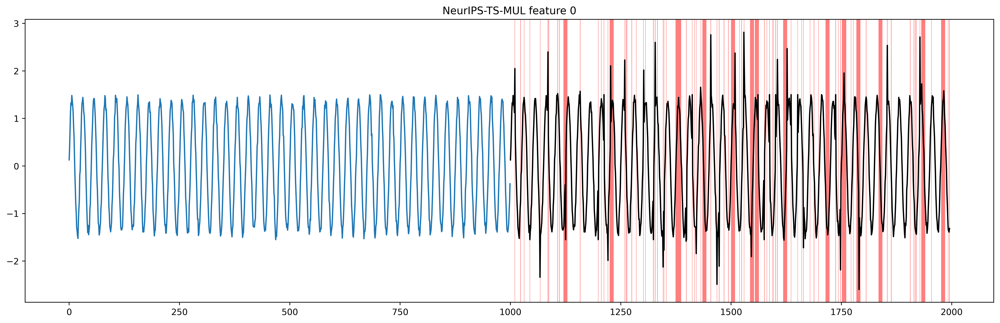

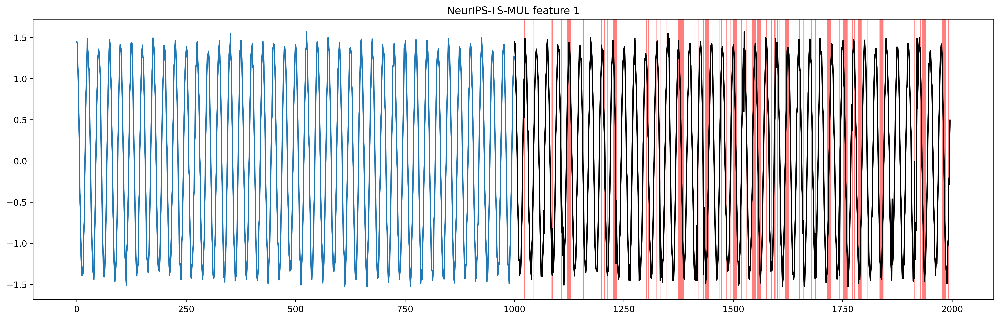

KeyboardInterrupt: 

In [22]:
for c in range(args.num_channels):
    dataset_name = "SWaT"
    plt.figure(figsize=(20, 6), dpi=500)
    plt.plot(train_X[:, c], color="C0")
    plt.plot(range(len(train_X), len(train_X)+len(test_X)), test_X[:, c], color="black")
    label = np.concatenate([np.array([0]*len(train_X)), test_y])
    plot_interval(plt, label)
    plt.title(f"{dataset_name} feature {c}")
    plt.show()

## Load Model

In [6]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT_normalization_ARevIN", f"best.pth"))

[2023-04-15 03:45:19,302] loading: ./checkpoints/MLP_SWaT_normalization_ARevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-15 03:45:19,311] train_errors.pt file exists, loading...
[2023-04-15 03:45:19,326] torch.Size([496789, 12])
[2023-04-15 03:45:19,328] test_errors.pt file exists, loading...
[2023-04-15 03:45:19,331] torch.Size([37493, 12])
[2023-04-15 03:45:19,625] loading: ./checkpoints/MLP_SWaT_normalization_ARevIN/best.pth @Trainer - torch.load_state_dict


## Training statistics

In [7]:
train_iterator = tqdm(
    tester.train_loader,
    total=len(tester.train_loader),
    desc="calculating reconstruction errors",
    leave=True
)

recon_errors = []
with torch.no_grad():
    for i, batch_data in enumerate(train_iterator):
        X = batch_data[0].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        recon_error = torch.nn.functional.mse_loss(Xhat, X, reduction='none')
        recon_errors.append(recon_error)

recon_errors = torch.cat(recon_errors, axis=0)

train_error_dist = recon_errors.mean(dim=(1, 2))

print(f"{recon_errors.shape}, {train_error_dist.shape}")

calculating reconstruction errors: 100%|██████████| 7763/7763 [00:10<00:00, 736.42it/s]

torch.Size([496789, 12, 51]), torch.Size([496789])


## Test: static threshold inference

In [8]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

anoscs_prev = []
Xhats_prev = []
with torch.no_grad():
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        Xhats_prev.append(Xhat)        
        e = F.mse_loss(Xhat, X, reduction='none')
        anosc = e.mean(dim=2)
        anoscs_prev.append(anosc)

Xhats_prev = torch.cat(Xhats_prev, axis=0).detach().cpu().numpy()
anoscs_prev = torch.cat(anoscs_prev, axis=0).reshape(-1).detach().cpu().numpy()

calculating reconstruction errors: 100%|██████████| 37493/37493 [00:24<00:00, 1526.78it/s]


In [9]:
th_q95 = torch.quantile(train_error_dist, 0.95).item()
th_q99 = torch.quantile(train_error_dist, 0.99).item()
th_q100 = torch.max(train_error_dist).item()
th_best_static = get_best_static_threshold(gt=test_y, anomaly_scores=anoscs_prev)
th_q95, th_q99, th_q100, th_best_static

(0.013887092471122742, 0.08290203660726547, 17.443635940551758, 7.464483)

In [10]:
# 95
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q95))
# 99
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q99))
# 100
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q100))
# oracle
print(get_summary_stats(test_dataset.y, anoscs_prev > th_best_static))

{'Accuracy': 0.3025009112812169, 'Precision': 0.14421704473089, 'Recall': 0.962553129122087, 'F1': 0.25084985294679346, 'tn': 83560, 'fp': 311772, 'fn': 2044, 'tp': 52540}
{'Accuracy': 0.3377674943767281, 'Precision': 0.14693380144786664, 'Recall': 0.9277443939616005, 'F1': 0.25368898551958896, 'tn': 101327, 'fp': 294005, 'fn': 3944, 'tp': 50640}
{'Accuracy': 0.8795464042176762, 'Precision': 0.880859375, 'Recall': 0.008262494503883923, 'F1': 0.016371424422825614, 'tn': 395271, 'fp': 61, 'fn': 54133, 'tp': 451}
{'Accuracy': 0.9438961939562052, 'Precision': 0.8720393569001369, 'Recall': 0.6300014656309542, 'F1': 0.7315194962666723, 'tn': 390286, 'fp': 5046, 'fn': 20196, 'tp': 34388}


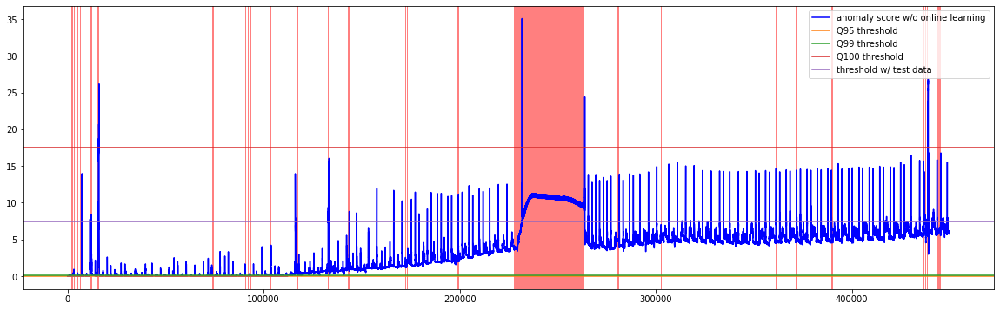

In [11]:
plt.figure(figsize=(20, 6))
#lt.ylim([-2, 5])
plt.plot(anoscs_prev, color="blue", label="anomaly score w/o online learning")
#plt.plot(anoscs, color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="C1", label="Q95 threshold")
plt.axhline(th_q99, color="C2", label="Q99 threshold")
plt.axhline(th_q100, color="C3", label="Q100 threshold")
plt.axhline(th_best_static, color="C4", label="threshold w/ test data")

#plt.plot(thrs, color="gold",label="dynamic threshold")
plt.legend()
plot_interval(plt, test_y)
plt.show()

## Value-based Pseudo-label guided Online Learning (separate threshold)

### 1. Single+CE

In [12]:
thr = init_thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr = torch.tensor(thr, requires_grad=True)
thr

tensor(0.0139, requires_grad=True)

In [111]:
ttlr = 0.005
thlr = 0.0005
gamma = 0.99999

In [112]:
import torch
import copy
from utils.tools import set_requires_grad


class EMAUpdater:
    def __init__(self, source_model, target_model, moving_average_decay, start_iter=0):
        super().__init__()
        self.source_model = source_model
        self.target_model = target_model
        self.moving_average_decay = moving_average_decay
        self.start_iter = start_iter

        set_requires_grad(self.target_model, False)
        self._update_moving_average(0.0)

    def _update_moving_average(self, moving_average_decay):
        with torch.no_grad():
            for target_params, source_params in zip(self.target_model.parameters(), self.source_model.parameters()):
                if source_params.requires_grad:
                    target_params.copy_(source_params.lerp(target_params, moving_average_decay))
            for target_buffers, source_buffers in zip(self.target_model.buffers(), self.source_model.buffers()):
                if source_params.requires_grad:
                    target_buffers.copy_(source_buffers)

    def update(self, iter_count):
        if iter_count < self.start_iter:
            self._update_moving_average(0.0)
        else:
            self._update_moving_average(self.moving_average_decay)

In [113]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT_normalization_ARevIN", f"best.pth"))

pretrained_model = tester.model
source_model = copy.deepcopy(pretrained_model)
target_model = copy.deepcopy(pretrained_model)
ema_updater = EMAUpdater(source_model, target_model, gamma)
source_model.revin.gamma = target_model.revin.gamma = gamma
source_model.revin.gamma, target_model.revin.gamma

[2023-04-15 00:42:18,521] loading: ./checkpoints/MLP_SWaT_normalization_ARevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-15 00:42:18,546] train_errors.pt file exists, loading...
[2023-04-15 00:42:18,556] torch.Size([496789, 12])
[2023-04-15 00:42:18,583] test_errors.pt file exists, loading...
[2023-04-15 00:42:18,585] torch.Size([37493, 12])
[2023-04-15 00:42:18,822] loading: ./checkpoints/MLP_SWaT_normalization_ARevIN/best.pth @Trainer - torch.load_state_dict


(0.99999, 0.99999)

In [114]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)


TT_optimizer = torch.optim.SGD([p for p in source_model.parameters()], lr=ttlr)
TH_optimizer = torch.optim.SGD([thr], lr=thlr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

smus, tmus = [], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    source_model.revin._update_statistics(X)
    target_model.revin._update_statistics(X)
    
    # target model inference
    thrp = torch.clamp(thr, min=init_thr)
    with torch.no_grad():
        Xhat = target_model(X)
        E = (Xhat-X)**2
        A = E.mean(dim=2)
        ytilde = (A > thrp).float()
        pred = (A > thrp)
    
    # update threshold
    TH_optimizer.zero_grad()
    yhat = torch.sigmoid((A-thrp))
    cls_loss = bce(yhat, ytilde)
    cls_loss.backward()
    TH_optimizer.step()
    
    # log target model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr.clone().detach().item())
    
    smus.append(source_model.revin.mean.clone())
    tmus.append(target_model.revin.mean.clone())
    
    # source model training
    Xhatp = source_model(X)
    Ep = (Xhatp-X)**2
    Ap = Ep.mean(dim=2)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (Ap*mask).mean()
    recon_loss.backward()
    TT_optimizer.step()
    
    
    # EMA
    ema_updater.update(1)
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()
smus = torch.cat(smus, axis=0).repeat(1, args.window_size, 1).reshape(-1, args.num_channels)
tmus = torch.cat(tmus, axis=0).repeat(1, args.window_size, 1).reshape(-1, args.num_channels)
smus = smus.detach().cpu().numpy()
tmus = tmus.detach().cpu().numpy()

calculating reconstruction errors: 100%|██████████| 37493/37493 [02:46<00:00, 224.62it/s]


In [115]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

(449916,) (449916,)
{'Accuracy': 0.526349362992203, 'Precision': 0.1859206276871867, 'Recall': 0.8595559138208999, 'F1': 0.3057154678942721, 'tn': 189895, 'fp': 205437, 'fn': 7666, 'tp': 46918}


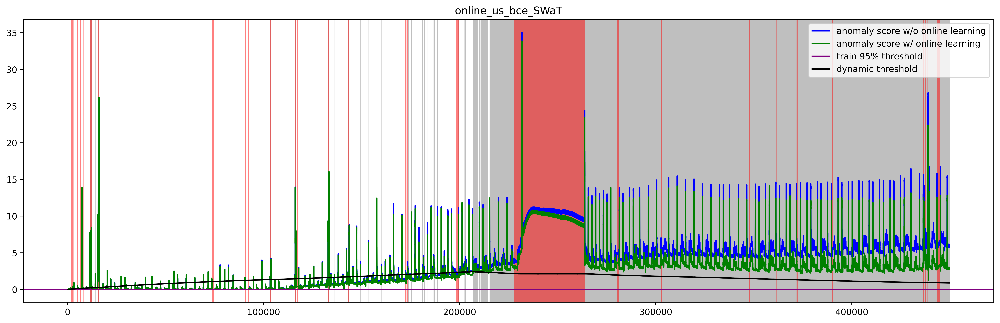

In [116]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
#plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plot_interval(plt, test_y[s:e])
plt.legend()
plt.show()

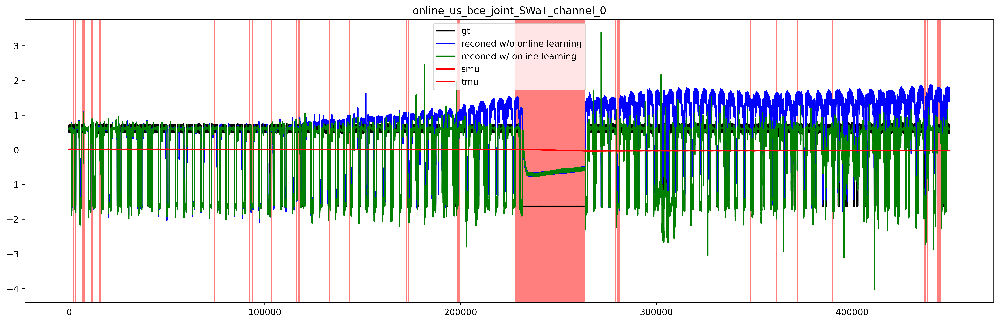

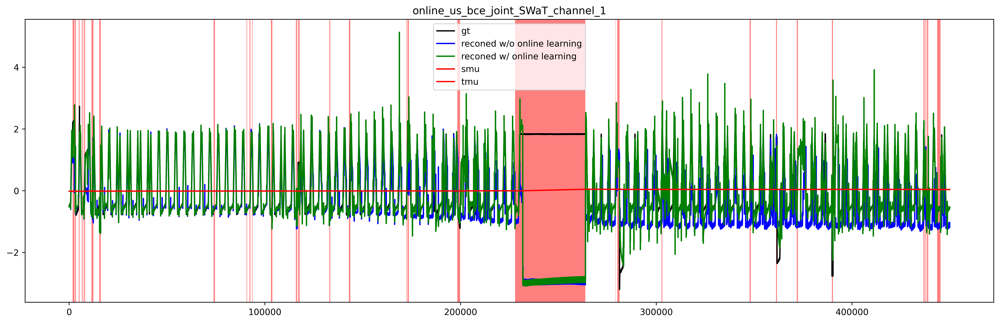

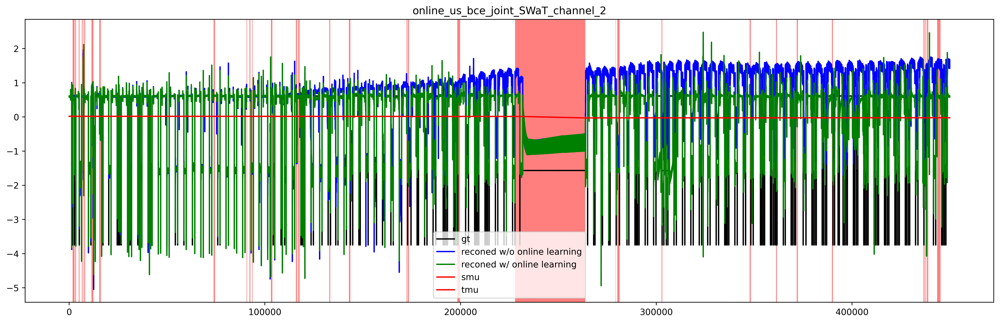

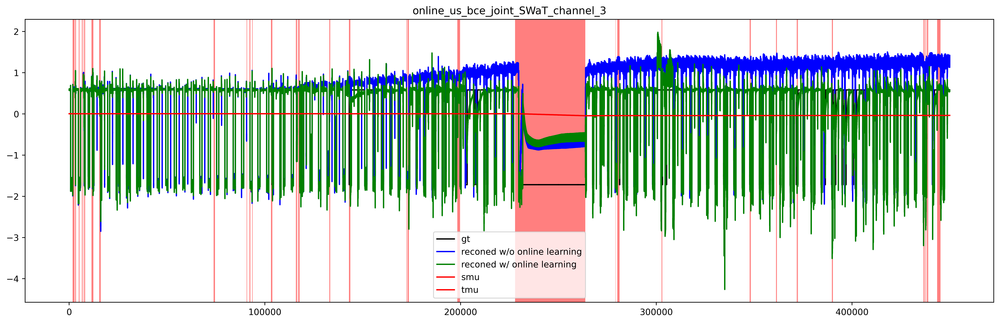

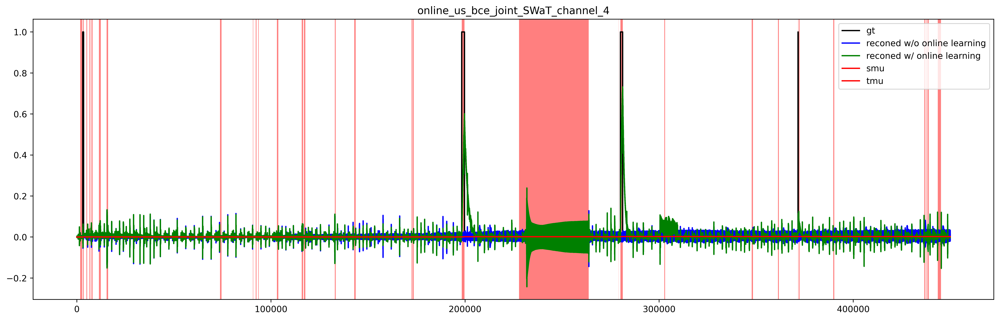

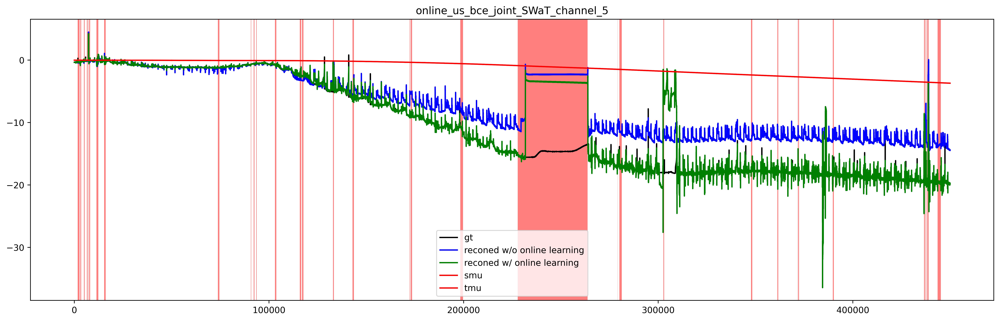

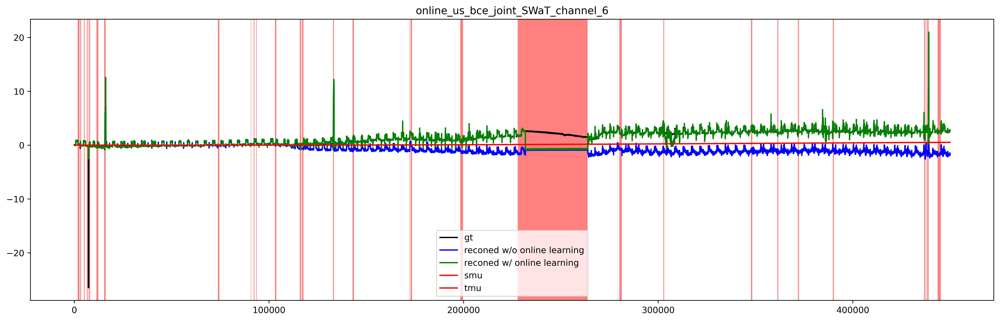

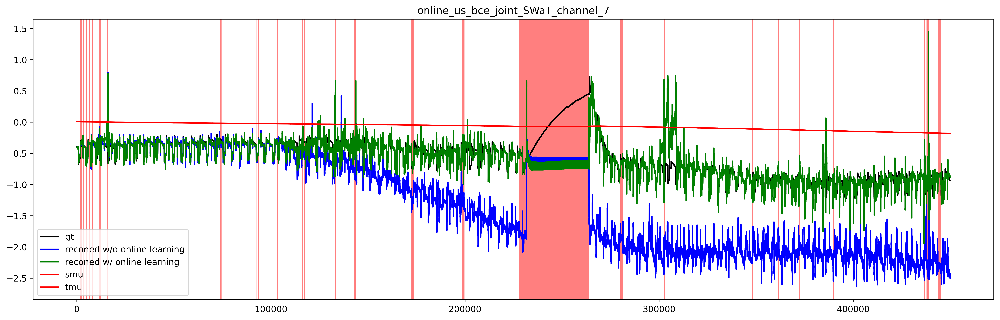

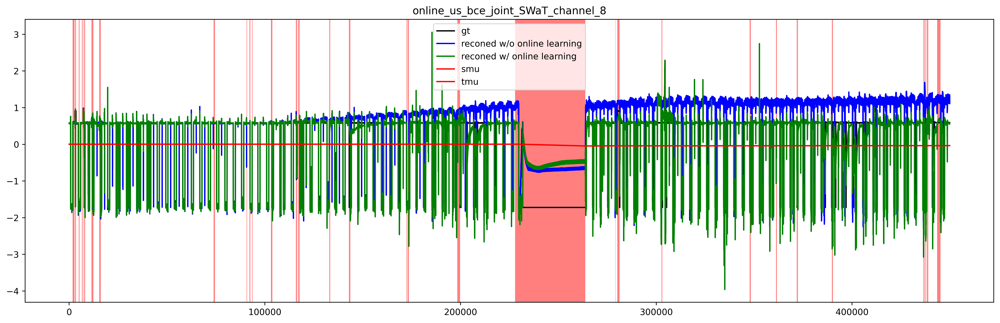

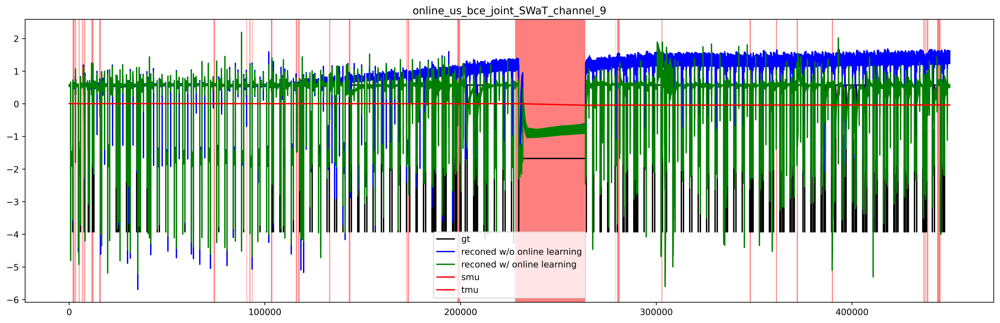

Error in callback <function flush_figures at 0x7f33144fbf70> (for post_execute):


KeyboardInterrupt: 

In [91]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
    
    plt.plot(smus[:, c], label = "smu", color="red")
    plt.plot(tmus[:,c], label = "tmu", color="red")
    plt.legend()
    plot_interval(plt, test_y)

### Just learn normals

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT", f"best.pth"))

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    Xhat = tester.model(X)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (A*mask).mean()
    recon_loss.backward()
    TT_optimizer.step()
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

In [ ]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=1)
plt.legend()
plt.show()

In [ ]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), linewidth=0.5, color="green", label="reconed w/ online learning")
    plt.plot(test_X[:, c], color="black", label="gt")
    plt.legend()
    plot_interval(plt, test_y)
    break

### src-tgt network

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT", f"best.pth"))


pretrained_model = tester.model
source_model = copy.deepcopy(pretrained_model)
target_model = copy.deepcopy(pretrained_model)
ema_updater = EMAUpdater(source_model, target_model, 0.99)

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([p for p in source_model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    with torch.no_grad():
        Xhat_tgt = target_model(X)
        E_tgt = (Xhat_tgt-X)**2
    Xhat_src = source_model(X)
    E_src = (Xhat_src-X)**2
    A = E_src.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat_src.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    
    if i>1000:
        flood_loss = torch.clamp(E_src-E_tgt, min=0).mean()
        flood_loss.backward()
    else:
        recon_loss = (A*mask).mean()
        recon_loss.backward()
    TT_optimizer.step()
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

In [ ]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=1)
plt.legend()
plt.show()

### Single + BCE + Label

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr = torch.tensor(thr, requires_grad=True)
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_PSM", f"best.pth"))

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([thr]+[p for p in tester.model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    Xhat = tester.model(X)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr.clone().detach().item())
    
    # learn new-normals and update threshold
    TT_optimizer.zero_grad()
    mask = (y == 0)
    yhat = torch.sigmoid((A - thr))
    cls_loss = bce(yhat, y.float())
    recon_loss = (A * mask).mean()
    loss = recon_loss + cls_loss
    loss.backward()
    TT_optimizer.step()
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
# result summary
print(test_y.shape, preds.shape)
result = get_summary_stats(test_y, preds)
print(result)

In [ ]:
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_label_bce_joint_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plt.legend()
plt.show()

In [ ]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), linewidth=0.5, color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)